# `Лекция 05. Segmentation and detection`


### `Материалы составили Иванов Егор (@e1vanov), Оганов Александр (@welmud), Находнов Максим (nakhodnov17@gmail.com), Глеб Афанасьев, Варламова Арина, Солдатов Владислав`

#### `Москва, Осенний семестр 2025`

Ноутбук опирается на материалы курса [Введение в глубокое обучение](https://github.com/mmp-practicum-team/mmp_dl_spring_2025/tree/main) кафедры ММП ВМК МГУ. Основной материал взят с [ноутбука](https://github.com/mmp-practicum-team/mmp_dl_spring_2025/blob/main/Seminars/10-cv-advanced-tasks/10-cv-advanced-tasks.ipynb) и [записи занятия](https://www.youtube.com/watch?v=mm7hp_Bt_38).

`Материалы`. Для каждой модели указана кликабельная ссылка на оригинальную статью. Под каждой картинкой есть ссылка на ее источник, как правило являющийся статьей по теме.


## `Мотивация`

Вы уже изучили операцию свертки и общую архитектуру сверточных нейронных сетей, с помощью которых решалась задача классификации: например, на изображениях котиков и собачек.

Сегодня мы двинемся дальше и изучим, как с помощью нейронных сетей решать более сложные задачи компьютерного зрения. Обобщая, можно сказать, что наша цель - научиться отвечать на вопрос "где изображено?".

### **Вопрос**. Что вы можете предложить в качестве ответа на вопрос "где изображено?"?

**Ответ.**

- Bounding box (ограничивающая рамка) - прямоугольник с параллельными осям сторонами, в который вложен объект. Классической параметризации нет, для любой из них необходимы 4 параметра. Например, координаты левого верхнего и правого нижнего углов:
$$
\left(x_1,y_1,x_2,y_2\right)
$$
или
координаты центра, ширина и высота:
$$
\left(x_c,y_c, w, h\right)
$$
- Выделить те и только те пиксели, которые относятся к объекту

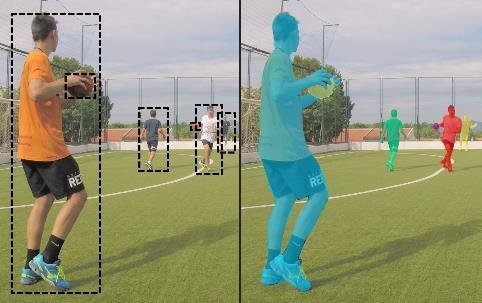

Методы выделения объектов | [Источник](https://www.researchgate.net/figure/Bounding-box-vs-instance-segmentation-on-players-and-ball-objects-4_fig1_340983355)

## `Постановки задач`

Опишем постановки задач, которые мы будем сегодня обсуждать. Общее деление выглядит следующим образом:

- **Локализация.** В дополнение к предсказанию метки категории класса определяется рамка, ограничивающая местоположение экземпляра одиночного объекта на картинке. Как правило, рамка имеет прямоугольную форму, её стороны ориентированы параллельно осям исходного изображения. Такую прямоугольную рамку называют термином "ограничивающая рамка" (англ. bounding box).
- **Детекция.** Необходимо выделить несколько объектов на изображении посредством нахождения координат их ограничивающих рамок и классификации этих ограничивающих рамок из множества заранее известных классов. Число объектов не известно заранее.
- **Семантическая сегментация.** На вход модели подаётся изображение, а на выходе для каждого пикселя является метка принадлежности этого пикселя к определённой категории. Задача семантической сегментации изображения с дифференцированием объектов называется задачей сегментации экземпляров (англ. instance segmentation).


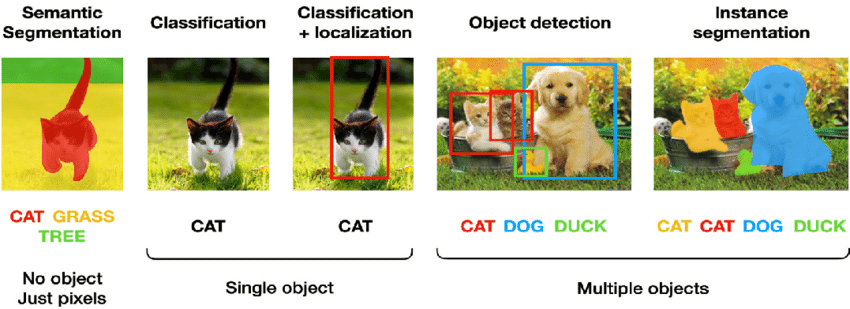

Задачи компьютерного зрения | [Источник](https://www.researchgate.net/figure/Computer-vision-tasks-Adapted-from_fig5_346091812)

## `Метрики качества`

### `Intersection over Union (IoU)`

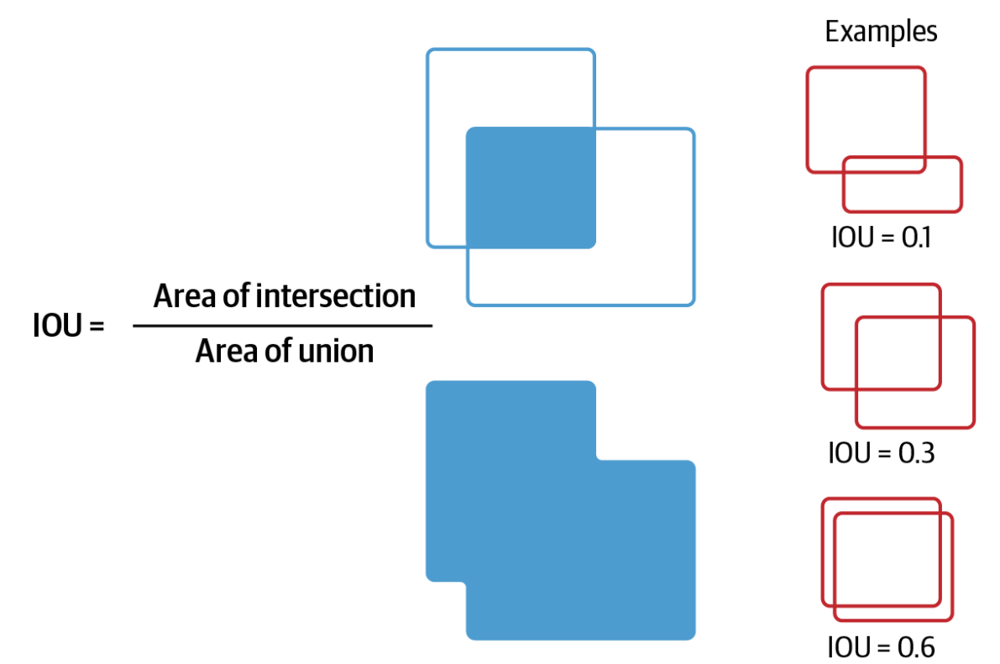

IoU. Определение и примеры | [Источник](https://www.oreilly.com/library/view/practical-machine-learning/9781098102357/)

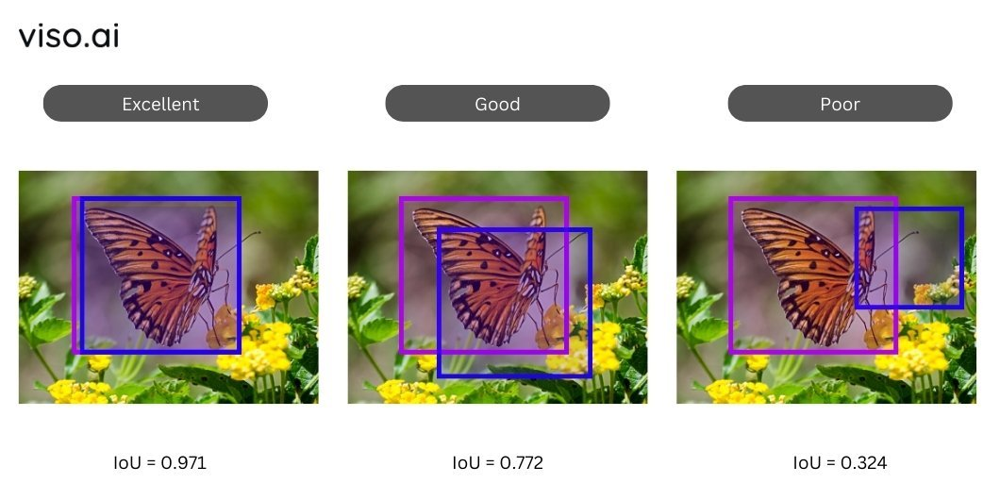

IoU. Примеры | [Источник](https://viso.ai/computer-vision/intersection-over-union-iou/)

#### **Вопрос**. Почему делим именно на меру объединения?

**Ответ**.
- Если делить на меру таргета, то максимальное значение метрики будет достигаться на произвольном прямоугольнике его покрывающем, т.е. например на рамке, совпадающей с границей самого изображения.
- Если делить на меру предикта, то максимальное значение метрики будет достигаться на ограничивающей рамке, покрывающей любое подмножество таргета.

### `Average Precision (AP) и mean AP (mAP)`

**Наблюдение**. IoU лежит в пределе от 0 до 1, где 0 соответствует отсутствию пересечения между предиктом и таргетом, а 1 - полному совпадению. Проводя аналогию с метриками бинарной классификации, можно вычислить precision и recall, где

- **True Positive (TP)** - IoU > threshold
- **False Positive (FP)** - IoU < threshold или дублированный bounding box для одного и того же объекта
- **False Negative (FN)** - объект не найден или уверенная (IoU > threshold) ошибка в классификации

Можем посчитать precision и recall, можем посчитать average precision (AP) для каждого класса и средний AP по всем классам:

$$
\textrm{mAP}=\frac{1}{K}\sum_{i=1}^K\mathrm{AP}_i
$$

## `Детекция`

### `R-CNN (2013)`

[Статья](https://arxiv.org/pdf/1311.2524v5) | 41 425 цитирований

**Идея**. Двухэтапный подход.

- *Первый этап*. Выделение подозрительных на наличие объектов подобластей (RoI - Regions of Interest).
- *Второй этап*. Подать выделенные на предыдущем этапе области в сеть для классификации и уточнения границ bounding box'а.

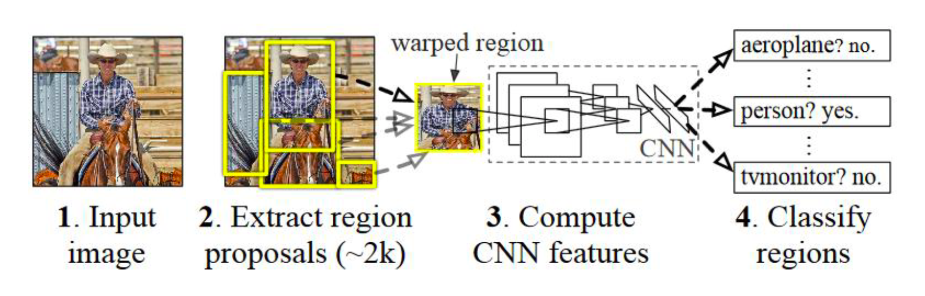

Алгоритм R-CNN | [Источник](https://arxiv.org/pdf/1311.2524v5)

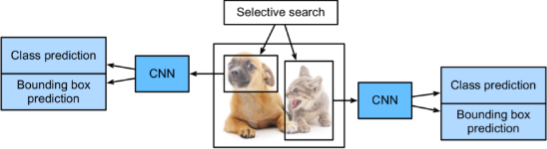

Алгоритм R-CNN | [Источник](https://d2l.ai/chapter_computer-vision/rcnn.html)

- Метод выбора RoI - конструктивно-эвристический Selective Search

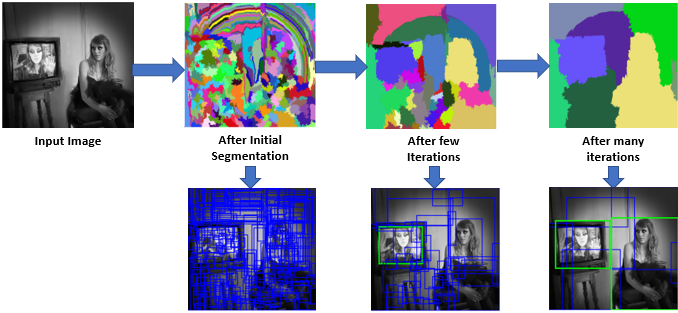

Пример работы Selective Search | [Источник](https://www.geeksforgeeks.org/selective-search-for-object-detection-r-cnn/)

**Замечания**.

- **Архитектура**. CNN в этом подходе используется исключительно как *feature extractor* (2013 год, нейросетям еще не доверяли полное решение задачи). На полученных ей признаках отдельно обучался SVM и отдельно линейная регрессионная модель для уточнения ограничивающей рамки.
- **Дотренировка (Finetune)**. Выбранную претренированную модель дообучали на конкретный датасет следующим образом.
    - Для каждого изображения генерировали гипотезы с помощью selective search
    - Считали, что в прямоугольнике изображен объект, если он имел IoU > 0.3 с некоторым объектом в таргет разметке.
    - Брали 32 окна с размеченным объектом и 96 окон без объекта, т.о. решалась задача классификации с K+1 классом (+ фон)
- **Уточнение границ**. На bounding box'ах с IoU > 0.3 для каждого класса обучалась линейная модель на CNN признаках, целевые значения:
$$
\left(
\frac{x-\hat x}{w},
\frac{y-\hat y}{h},
\log\frac{\hat w}{w},
\log\frac{\hat h}{h}
\right),
$$
где величины с крышкой соответствуют предложенной ограничивающей рамке из selective search.

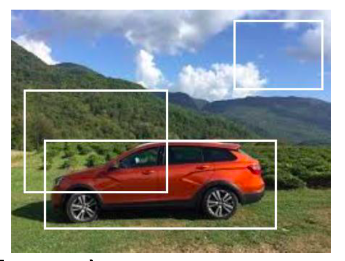

R-CNN Finetuning | [Источник](https://github.com/Dyakonov/DL/blob/master/2020/DL2020_033objectdetection_06n.pdf)

**Проблема**. Selective search порождает много регионов, из-за чего один и тот же объект может быть покрыт несколькими RoI, для каждого из которых модель даст правильный ответ.

**Решение**. Non Maximum Suppression (NMS)

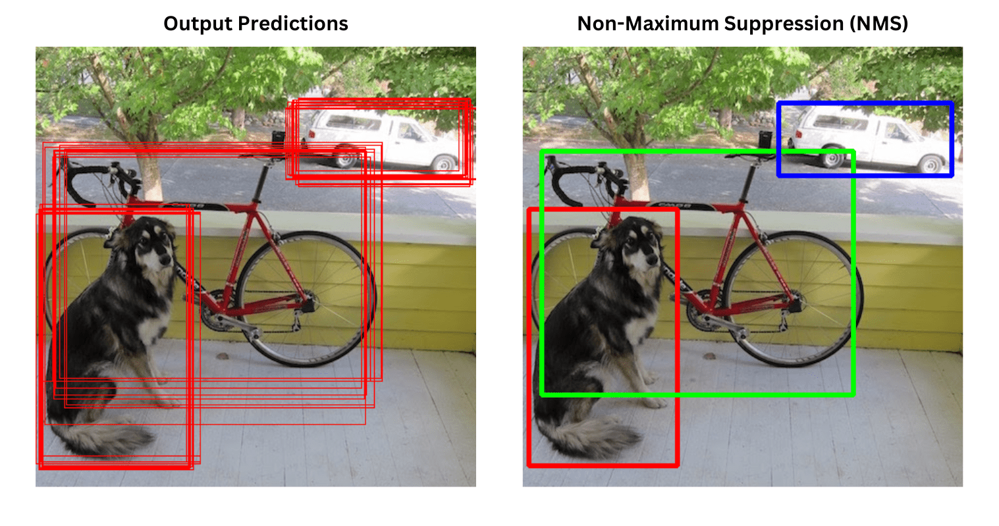

Работа NMS | [Источник](https://learnopencv.com/weighted-boxes-fusion/)

#### **Вопрос**. Какие недостатки имеет метод R-CNN?

**Ответ**.
- Большое время работы (каждый RoI подается на вход в сеть)
- Много подозрительных и при этом бесполезных RoI (дисбаланс классов, из-за которого в оригинальной статье в батче при дообучении соотношение RoI с объектом к RoI с фоном было 32:96)
- Не адаптируемый под данные алгоритм выбора RoI

### `Fast R-CNN (2015)`

[Статья](https://arxiv.org/abs/1504.08083) | 39 365 цитирований

Ключевой недостаток подхода R-CNN заключается в скорости работы. Бутылочным горлышком является запуск полного алгоритма классификации для всех гипотез.

**Идея**. Вырезать подозрительные на объект регионы не из изначального изображения, а из карты признаков, которая строится только один раз для всего входного изображения целиком. Иными словами, переставить "crop" и "feature extraction" местами.

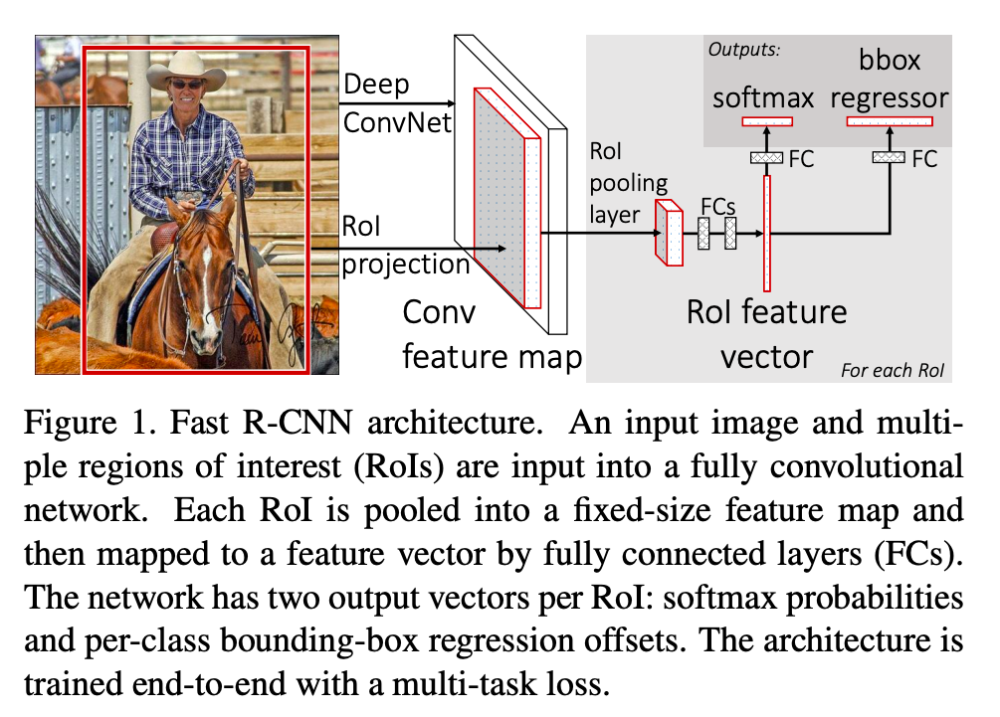

Архитектура Fast R-CNN | [Источник](https://arxiv.org/pdf/1504.08083)

**Проблема**. Как единообразно обрабатывать гипотезы различных масштабов и соотношений сторон?

**Решение**. В статье предлагается RoI Pooling Layer.

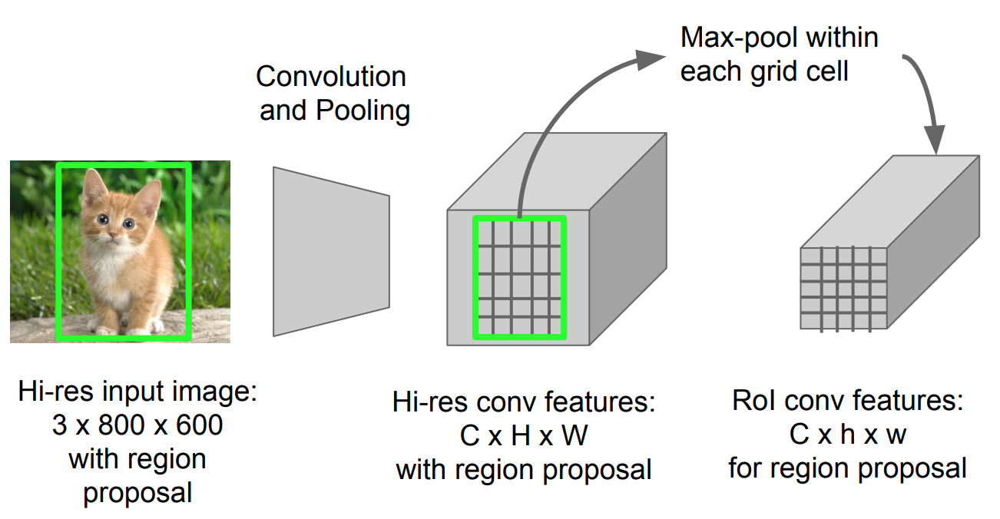

RoI Pooling Layer | [Источник](https://cs231n.stanford.edu/slides/2016/winter1516_lecture8.pdf)

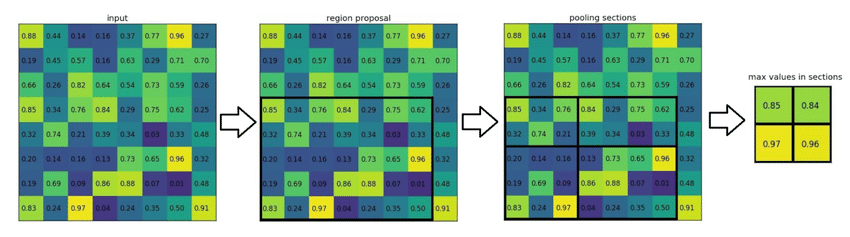

Пример работы RoI Pooling Layer | [Источник](https://www.researchgate.net/figure/Schematic-representation-of-ROI-pooling-17_fig8_350090136)

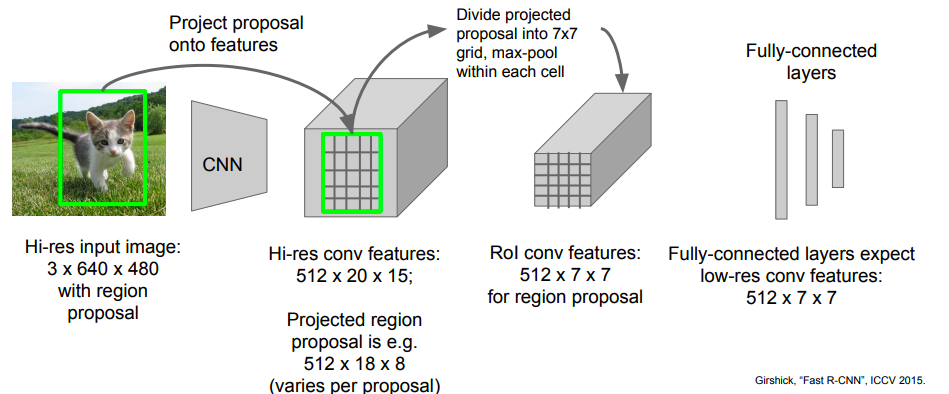

Работа RoI Pooling Layer | [Источник](https://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture11.pdf?ref=jeremyjordan.me)

### `Faster R-CNN (2015)`

[Статья](https://arxiv.org/abs/1506.01497) | 52 553 цитирований

**Проблема**. Fast R-CNN все еще зависит от конструктивно-эвристического алгоритма выбора прямоугольников подозрительных на объект.

**Идея**. Решать и эту подзадачу с помощью нейронной сети - RPN (Region Proposal Network)

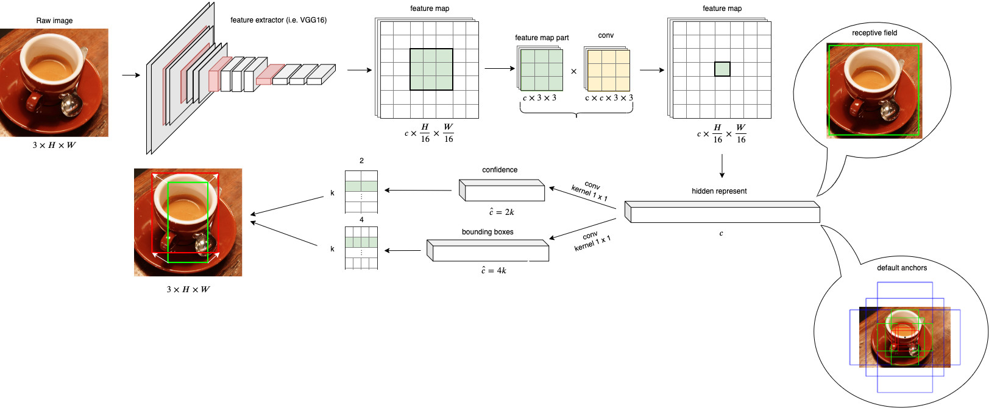

Схема работы RPN

**Замечания**.

- RPN для каждой ячейки предсказывает несколько гипотез следующим образом. Существует набор дефолтных якорей (англ. anchors) - семейство ограничивающих рамок на разных масштабах и с разными соотношениями сторон (в оригинальной статье их было 9). Для каждого из якорей решалась регрессионная задача для уточнения его границ и задача бинарной классификации на наличие внутри объекта.
- **Алгоритм обучения** | 4-Step Alternating Training в разделе 3.2 оригинальной статьи

    1. *Тренировка RPN сети*. Сверточные слои инициализируются предобученными весами W. Дообучаем на задаче определения регионов с каким-либо классом (уточнением класса занимается часть Fast R-CNN).
    2. *Тренировка Fast R-CNN сети*. Так же, как и в **1**. инициализируем Fast R-CNN весами W. Дообучаем, используя гипотезы об объектах с помощью RPN сети, обученной в **1**. В этот раз задачей обучения является уточнение координат и определение конкретного класса объекта.
    3. Используя веса из **2**. обучаем только RPN часть (слои, идущие до RPN сети, принадлежащие feature extractor сети, замораживаются и никак не изменяются).
    4. Используя веса из **3**. (уже более точно настроенный RPN), обучаем слои для Fast R-CNN (остальные веса – идущие ранее или относящиеся к RPN — заморожены).

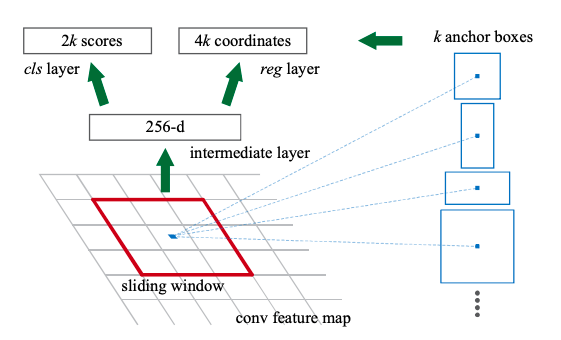

RPN | [Источник](https://arxiv.org/pdf/1506.01497)

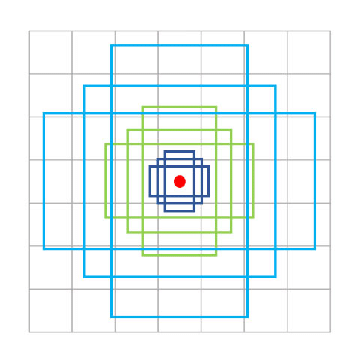

Примеры якорей (3 соотношения сторон на 3 разных масштабах) | [Источник](https://www.researchgate.net/figure/Faster-RCNN-uses-9-anchor-boxes-to-get-suggestion-boxes-Rectangular-boxes-in-the-same_fig1_348340498)

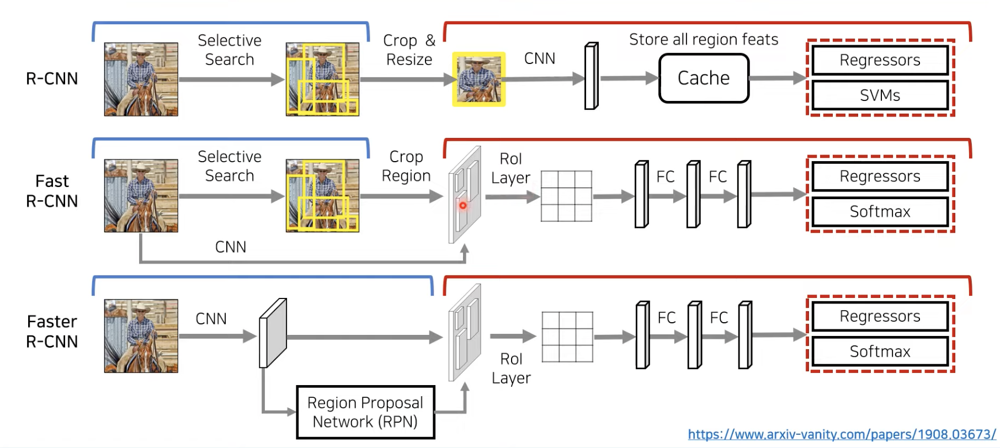

Модели семейства R-CNN

### `YOLO (You Only Look Once) (2015)`

[Статья](https://arxiv.org/pdf/1506.02640) | 56 999 цитирований

**Идея**. Использовать one-stage (или proposal-free) подход. Иными словами, обучить сеть, которая выдает сразу (за один просмотр изображения) и ограничивающие рамки, и классификацию объектов на них.


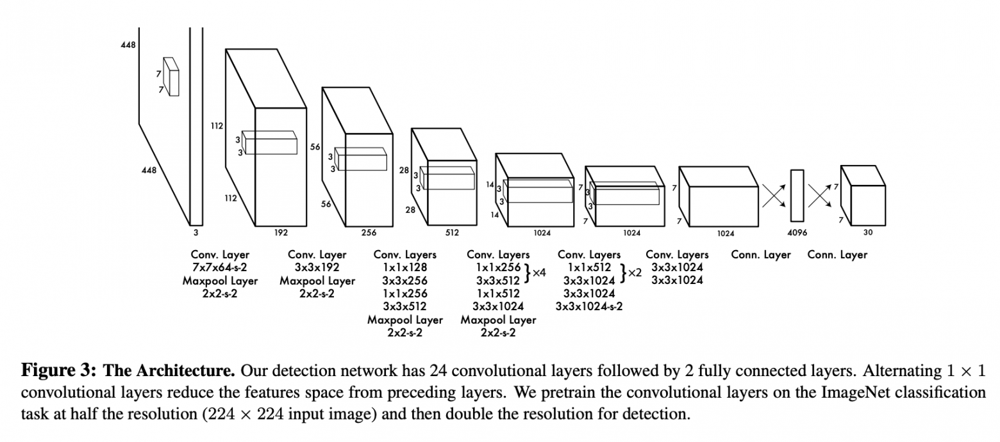

Архитектура YOLO

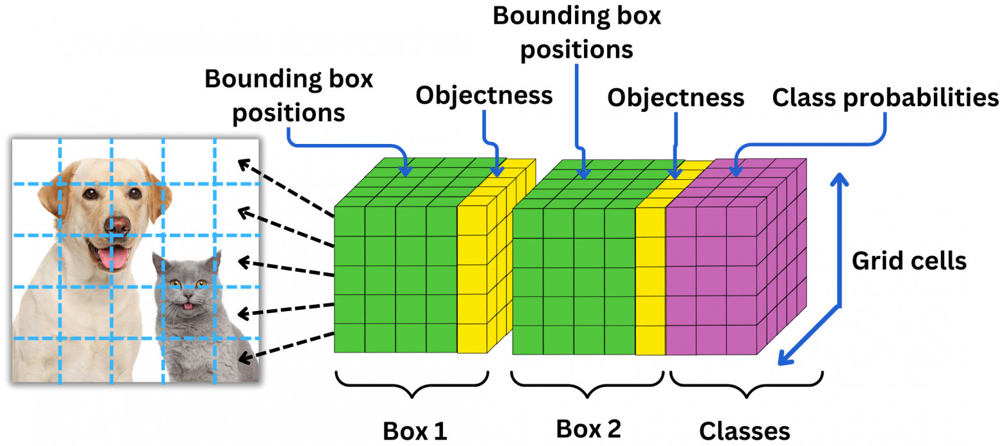

Выходной слой YOLO

### `YOLO-Word (2024)`

[Статья](https://arxiv.org/abs/2401.17270) | 620 цитирований


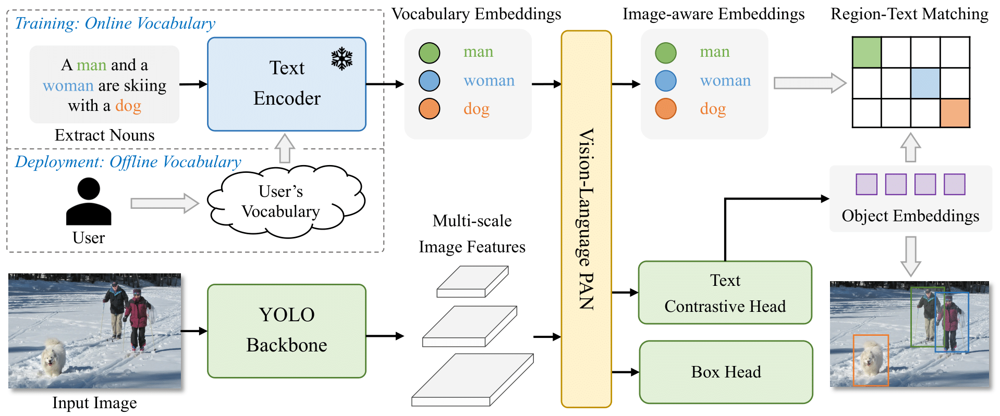

Диаграмма метода YOLO-Word

## `Семантическая сегментация`

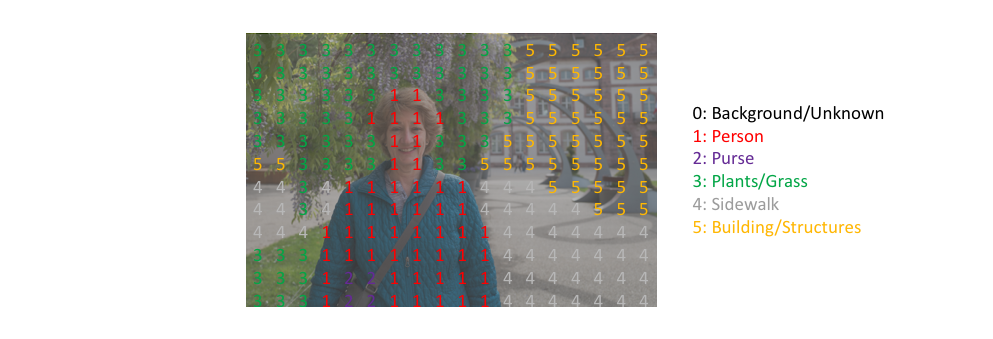

Решение задачи семантической сегментации | [Источник](https://www.jeremyjordan.me/semantic-segmentation/)

**Идея**. Полностью сверточный подход (Fully Convolutional NN). Вход: изображение, выход: изображение. Используя соответствующие паддинги, можно сделать полностью сверточную сеть, передающую на выход изображение того же разрешения, что и входное.

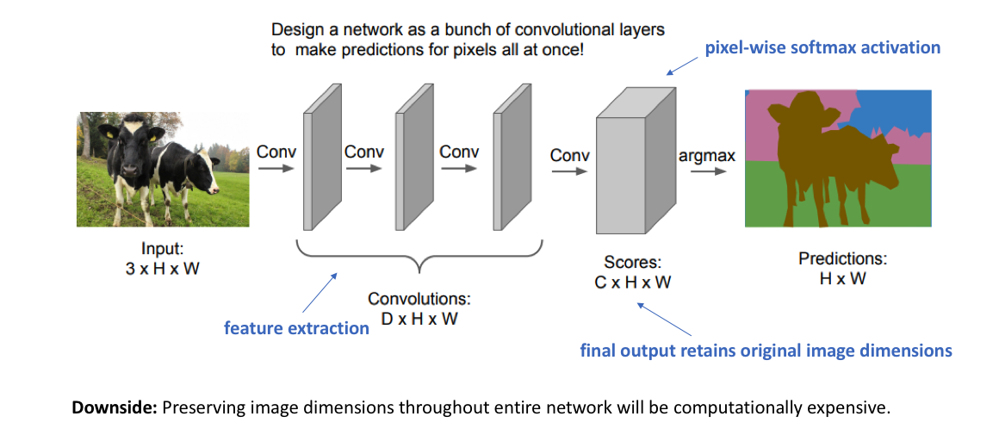

Полностью сверточный подход | [Источник](https://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture11.pdf?ref=jeremyjordan.me)

### **Вопрос**. Какие проблемы могут быть у такого подхода?

**Ответ**. Нужно получить изображение того же разрешения, что может быть вычислительно дорого.

**Обсуждение / наблюдение**. Как бы мы определяли, где на картинке изображен кот? Мы бы нашли уши, глаза, нос, лапы, хвост и т.д. и, исходя из их относительного расположения, получили бы ответ. Суть в том, что число признаков, которые мы назвали, информационно много меньше, чем все исходное изображение (полная информация о всех пикселях). Что если сначала сжать изображение (использовать классические свертки и pooling'и), т.е. получить скрытые представления для "носа, ушей, глаз, лап и хвоста", а потом их разжать для получения ответа?

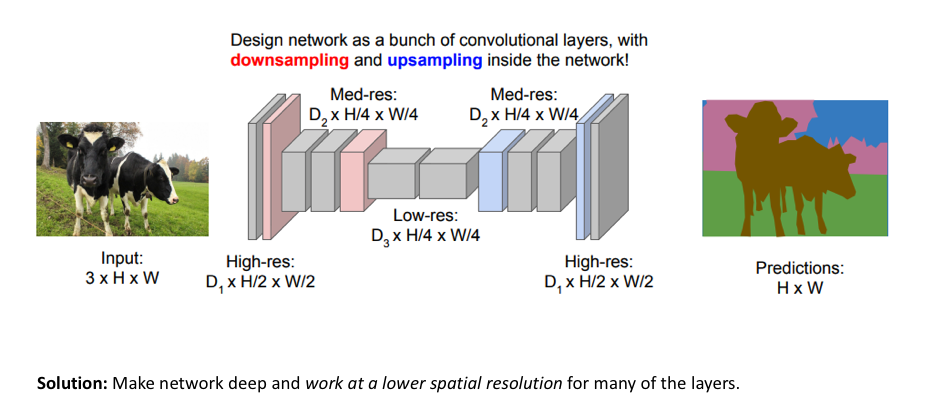

Энкодер-декодер архитектура | [Источник](https://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture11.pdf?ref=jeremyjordan.me)

### **Вопрос**. Как разжимать? Классические свертки не повышают размерность.

**Ответ**. Используем методы повышения размерности.

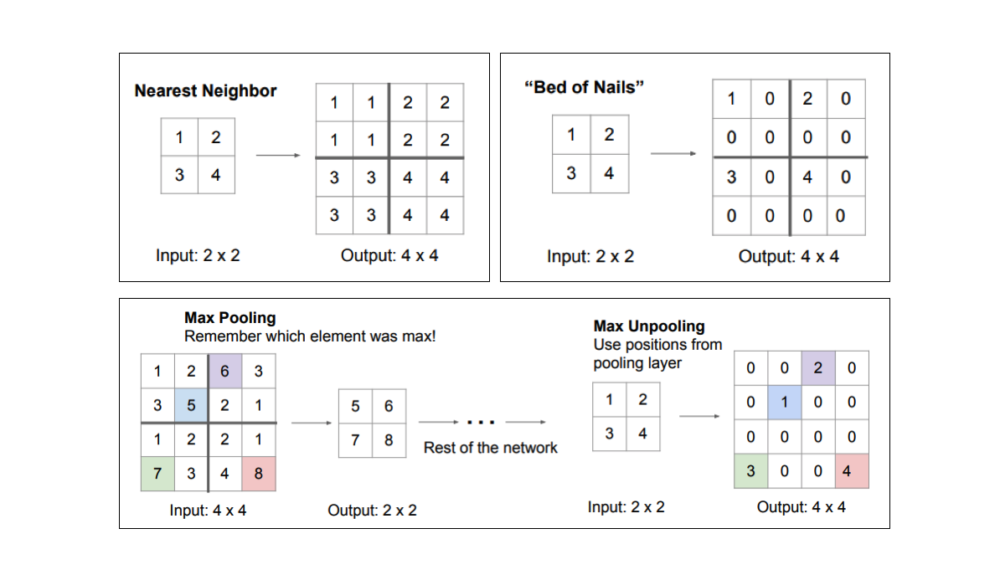

Непараметрические методы повышения размерности | [Источник](https://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture11.pdf?ref=jeremyjordan.me)

#### **Transposed convolution**

Рассмотрим операцию свертки как произведение матрицы на вектор. Итак,

Пусть $\textbf x=(x,y,z)^\top$ и $\textbf a = (a, b, c, d)^\top$, тогда
для свертки с ядром размера 3, параметрами stride = 1 и padding = 1 верно, что:
$$
\textbf x * \textbf a=\textbf X\textbf a =
\begin{bmatrix}
    x & y & z & 0 & 0 & 0 \\
    0 & x & y & z & 0 & 0 \\
    0 & 0 & x & y & z & 0 \\
    0 & 0 & 0 & x & y & z
\end{bmatrix}
\begin{bmatrix}
    0 \\ a \\ b \\ c \\ d \\ 0
\end{bmatrix}
=
\begin{bmatrix}
    ay + bz \\
    ax + by + cz \\
    bx + cy + dz \\
    cx + dy
\end{bmatrix}
$$
Определим операцию "обратной в смысле размерностей" (транспонированной) свертки следующим образом:
$$
\textbf x *^\top \textbf a := \textbf X^\top \textbf a
=
\begin{bmatrix}
    x & 0 & 0 & 0 \\
    y & x & 0 & 0 \\
    z & y & x & 0 \\
    0 & z & y & x \\
    0 & 0 & z & y \\
    0 & 0 & 0 & z
\end{bmatrix}
\begin{bmatrix}
    a \\ b \\ c \\ d
\end{bmatrix}
=
\begin{bmatrix}
    ax \\
    ay + bx \\
    az + by + cx \\
    bz + cy + dx \\
    cz + dy \\
    dz
\end{bmatrix}
$$

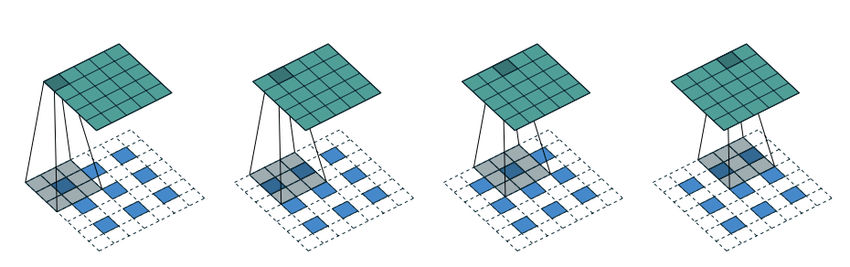

Объемная иллюстрация транспонированной свертки | [Источник](https://www.researchgate.net/figure/Figure-B3-The-transposed-convolution-operation-also-called-deconvolution-performing_fig31_324783775)

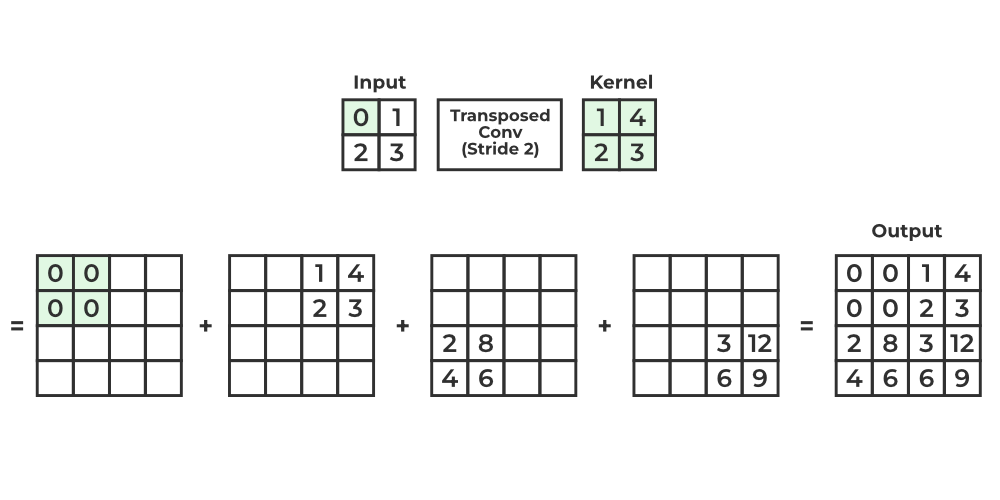

Обучаемое upsampling преобразование | [Источник](https://www.geeksforgeeks.org/what-is-transposed-convolutional-layer/)

**Проблема**. Модель помнит что, но не помнит где. Иными словами, модель забывает "глобальный контекст".

**Интерпретация**. Продолжим пример с котиками. Находясь в глубине сети вы знаете, что уши есть где-то слева, глаза есть где-то в середине, хвост есть где-то справа, лапок нет вообще нигде. *Задача*: нарисуйте котика. Почти наверное у вас получится не то, что нужно. Если бы вы располагали информацией, где глаза расположены относительно ушей и где конкретно справа был найден хвост, вы бы справились лучше.

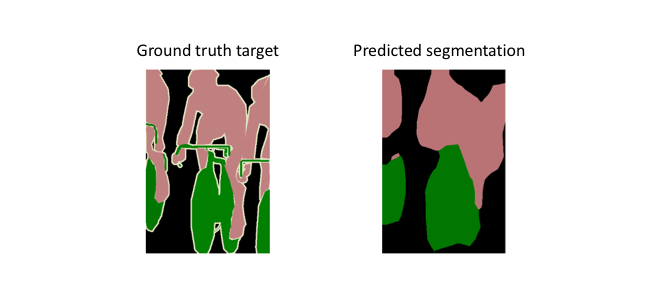

Утеря глобального контекста | [Источник](https://www.jeremyjordan.me/semantic-segmentation/)

**Комментарий.** Модель поняла, что "велосипедист где-то над велосипедом" и прочие общие паттерны, но детали восстанавливает очень плохо, так как теряет информацию с высоких разрешений.

### **Вопрос**. Как бороться с утерей глобального контекста?

**Ответ**. Объединять информацию с разных уровней дискретизации. Иными словами, сообщать модели, как раскрыть сжатое представление из выхода энкодера в ответ.

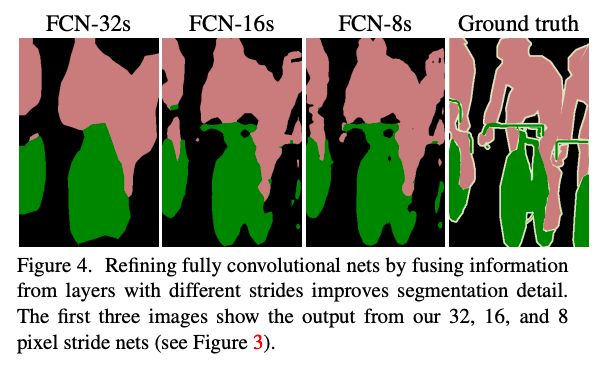

Уточнение деталей с увеличением числа проброшенных связей | [Источник](https://arxiv.org/pdf/1411.4038)

### `U-Net`

[Статья](https://arxiv.org/pdf/1505.04597) | 101 248 цитирований

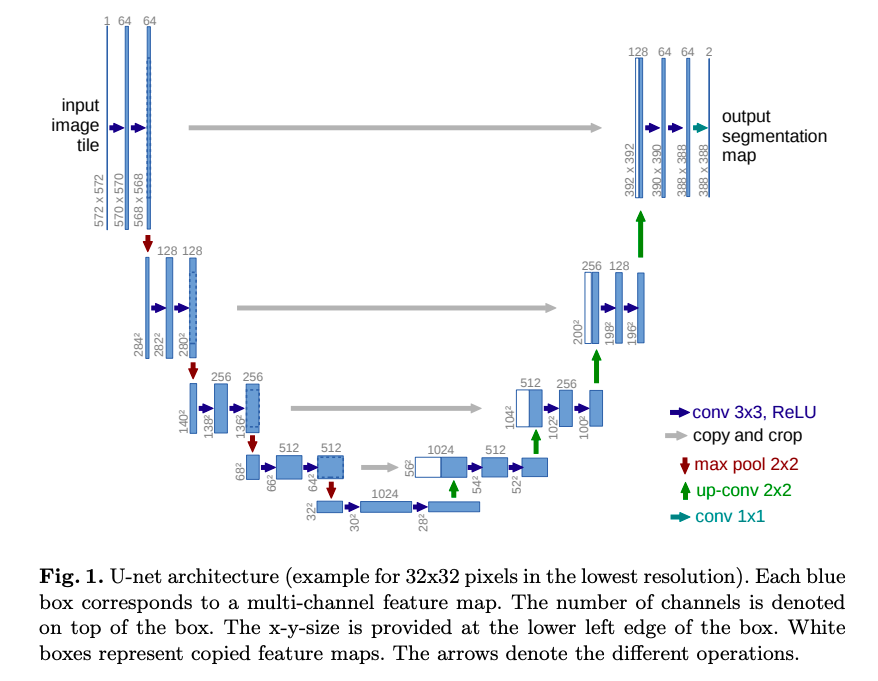

Архитектура U-Net | [Источник](https://arxiv.org/pdf/1505.04597)

### `Link-Net`

[Статья](https://arxiv.org/abs/1707.03718) | 1 986 цитирований

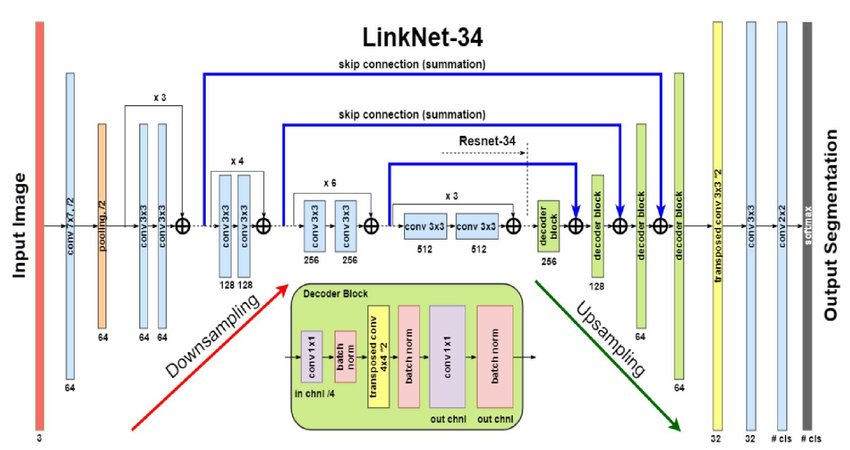

Архитектура Link-Net | [Источник](https://www.researchgate.net/figure/Schematic-view-of-LinkNET-34s-architecture-16_fig3_347115383)

### `Offtop`. U-Net как нейросетевой подход для решения дифференциальных уравнений

**Мотивация**. Пример ниже - это `offtop`, который приводится для того, чтобы показать, что архитектура U-Net применима не только для решения задачи семантической сегментация.

Пусть имеется семейство дифференциальных уравнений в области $\mathcal D$ на двумерную функцию  $u(x,y)$, параметризованное семейством функций $\mathcal A$. Например,
$$
\nabla\cdot (\textbf a\: \nabla u(x,y)) + u(x,y) = \textbf f,\: (x,y)\in\mathcal D
$$
$$
u(x,y) = 0, \:(x,y)\in\partial D
$$
Хотим подавать нейронной сети на вход дискретизации функций $\textbf a, \textbf f$ и получать на выходе дискретизацию $\textbf u$.

**Замечание**. Вообще говоря, существуют нейросетевые подходы (Neural Operators (NO)), ставящие своей задачей решение в более сложной постановке:
- независимость от дискретизации
- уточнение решение с измельчением дискретизации

Для примера мы рассмотрим зафиксированную дискретизацию. В таком случае
задача предсказания $\textbf u$ по $\textbf a, \textbf f$ это задача изображение -> изображение.

**Вопрос**. Почему для ее решения хорошо подходит U-Net?

**Ответ**. Мы предполагаем, что все функции достаточно гладкие и "хорошие", а значит их разложения в полезные с точки зрения физики ряды (например, Фурье) будут иметь существенно ненулевыми ограниченное число первых коэффициентов, а потому полезной информации в изображении достаточно немного (вспоминаем про пример с "ушами, глазами, лапами и тд"). Мы предполагаем, что эту информацию можно сначала закодировать encoder-блоками, а после с использованием глобального контекста декодировать в искомую функцию.

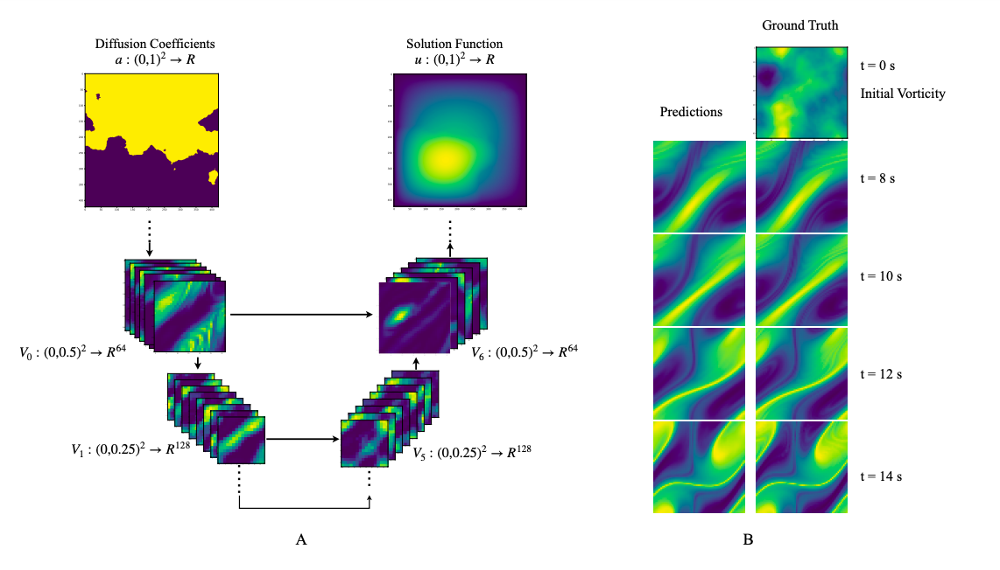

UNO (U-shaped Neural Operator) | [Источник](https://arxiv.org/pdf/2204.11127)

### `DINO: knowledge distillation with no labels (2021)`

[Статья](https://arxiv.org/abs/2104.14294) | 8 544 цитирований

Раньше мы обучали модели для решения конкретных задач, например, классификация, сегментация, детекция. Иногда так оказывается, что векторные представления, полученные с помощью "хорошей модели", намного важнее, чем сама модель. При этом задача получение хорошего векторного представления, которое содержит нужную информацию, более общая, чем конкретная задача.

**Вопрос**. Какие модели для получения эмбеддингов слов вы знаете? Какие из них лучше всего сейчас работают?

**Ответ**. Если не учитывать классические методы, как word2vec и другие, то скорее всего BERT и другие трансформерные модели.

Большинство современных интересных результатов в области глубокого обучения были получены с помощью трансформеров. Давайте вспомним, что отличает трансформеры от других моделей.

**Вопрос**. Благодаря чему трансформерные архитектуры достигают превосходных результатов? Можете считать, что мы сейчас обсуждаем BERT.

**Ответ**. Во-первых, архитектура, а в частности механизм внимания (мы не будем останавливаться на смыслах и интерпретациях). Во-вторых, self-supervised pretraining (в случае BERT мы решаем задачу маскирования) благодаря, которому нам не нужны миллиарды размеченных данных для большой архитектуры.


Теперь представим, что стоит задача получения "хороших" векторных представлений изображений. Осталось понять, чему должно удовлетворять "хорошее" векторное представление изображения. В общей постановке под "хорошим" можно понимать много чего разного, например:

- Объекты одного класса были ближе, а разных далеко;
- Линейная интерполяция в латентном пространстве делает плавный переход между изображениями.

**Вопрос**. Представим, что мы решаем задачу сегментации, что важно для сегментации котенка? Какую проблему мы обсуждали? Почему архитектура U-Net именно такая?

**Ответ**. Мы хотим учитывать глобальный контекст и не терять информацию, что ухо котенка является котенком.

Мы бы хотели получить такие векторные представления, чтобы для разных аугментаций одного изображения, например, размера, изменения разрешения, поворота получались похожие векторные представления. Список аугментаций можно расширить до:

1) RandomHorizontalFlip;
2) ColorJitter;
3) RandomResizedCrop;
4) GaussianBlur;
5) Solarization.

Осталось понять, как выучить такую модель. Если мы возьмем изображение и построим по нему разные аугментации, например одни будут выделять локальные изображения (с RandomResizedCrop), а другие глобальные (без RandomResizedCrop), то мы ожидаем, что модель должна выдавать похожие "хорошие" эмбеддинг. 

**Вопрос**. Как вы думаете получить "хороший" эмбеддинг, который совпадает с настоящим изображением проще через локальное или глобальное изображение?

**Ответ**. Многое, конечно, зависит от аугментаций, но кажется получить эмбеддинг котенка, проще когда видно и хвост и ушки с лапками. Мы предполагаем, что наши модели умеют извлекать информацию из изображений, даже из глобального контекста, так как все строим на базе трансформерной архитектуры (например ViT).


По сути, мы хотим, чтобы вектор $f(x^{\text{local}})$ был похож на $f(x^\text{global})$, где $f(\cdot)$ нейросеть, а $x^{\text{local}}$ и $x^\text{global}$ соответственно локальные и глобальные изображения.

Похожий метод, только намного аккуратнее и точнее реализован в статье [Emerging Properties in Self-Supervised Vision Transformers](https://arxiv.org/abs/2104.14294). Способ обучения одной нейросети (студента) на другую (учителя), которая уже умеет решать задачу, называется **knowledge distillation**, впервые описан в [статье](https://arxiv.org/abs/1503.02531) | 27462 цитирований.

**Вопрос**. Почему нам не подходит **knowledge distillation** в стандартном варианте?

**Ответ**. У нас нет модели учителя, мы лишь знаем, что, возможно, задача для $x^\text{global}$ проще и более информативная.


Поэтому в работе предлагают **knowledge DIstillation with NO labels** или кратко **DINO**. Алгоритм обучения представлен ниже.

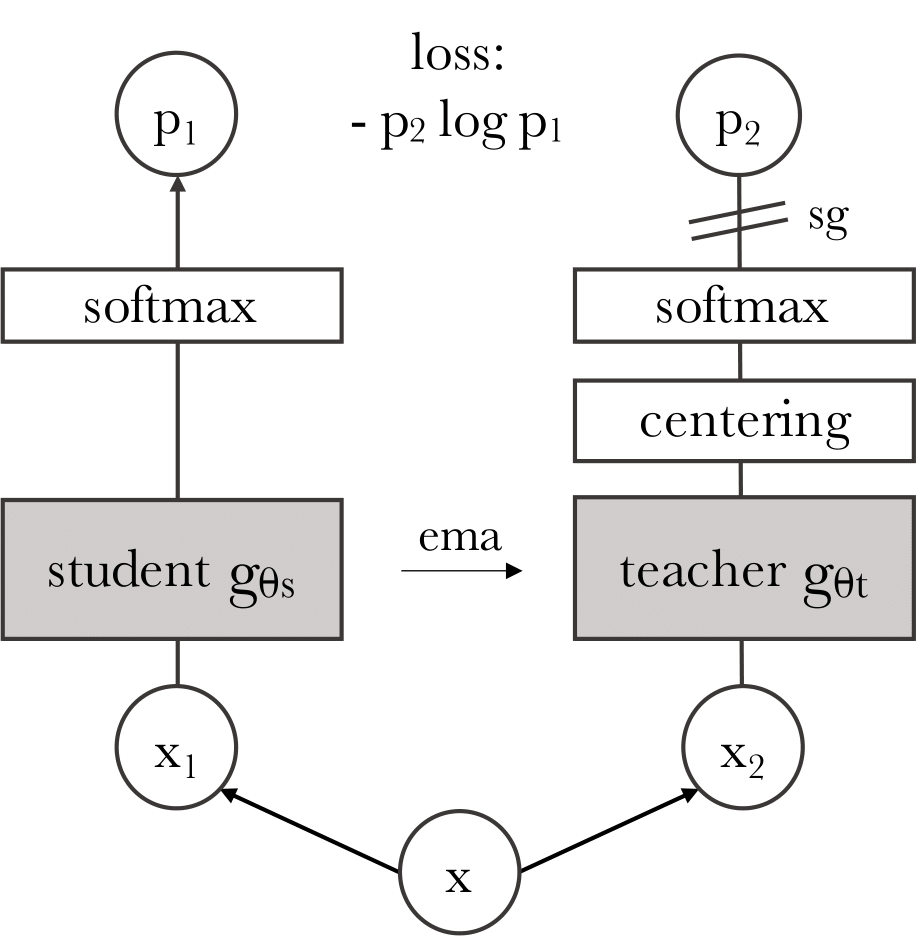

Self-distillation with no labels | [Источник](https://arxiv.org/abs/2104.14294)

Основные детали:

- $x_1$ и $x_2$ изображения, полученные с помощью различных аугментаций из изображения $x$; 
- Модель учителя и студента имеют одну архитектуру;
- Веса учителя не обучаемы и являются ema сглаженными весами студента;
- **sg** означает stop grad, то есть градиенты не проходят в модель учителя;
- Обучается на кросс-энтропию, так как наша цель, чтобы  ученик был похож по распределению на учителя;
- Важно, что $p_2 \log p_1$, а не наоборот, так как мы учим именно студента;
- Блок centering, центрирует выход teacher с учетом истории на прошлых батчах. Такой прием позволяет не вырождаться учителю и делает обучение стабильным.


**Напоминание**. ema веса модели определяются так: $x_{\text{ema}}^{k + 1} = m \cdot x_{\text{ema}}^{k} + (1 - m) x^k$, где $x^k$ веса модели после $k$ итераций обучения. На практике на ema весах всегда лучше метрики. [Хорошая статья](https://arxiv.org/abs/1803.05407), где показывается связь между сглаживанием весов и широким минимум.

#### `DINO: cегментация`

С помощью такого обучения, мы действительно получим **"хорошие"** векторы, которые учитывают разные размеры и масштабы изображений. 

Вспомним ради чего мы все начали, а именно вспомним о задаче сегментации. Естественно в статье множество результатов, но нас интересует именно сегментация. Если мы хотим сегментировать объект, то наша цель выделить все пиксели связанные с ним. Для начала стоит понять, как сегментировать "самый важный" объект на изображении? Для этого стоит посмотреть self-attention для `[CLS]` токена. Пример ниже:

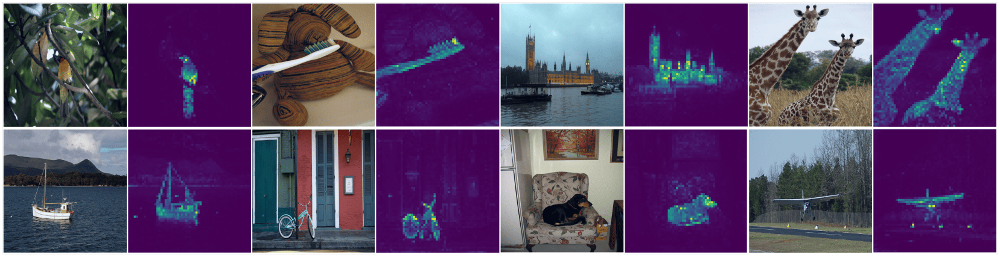

Self-attention from a Vision Transformer with 8 × 8 patches trained with no supervision | [Источник](https://arxiv.org/abs/2104.14294)

При этом если использовать выход self-attention для `[CLS]`, то сегментационная маска получается лучше, чем для некоторых supervised методов.

**Вопрос**. Мы знаем, что разные головы attention извлекают разные контексты, как вы думаете как будут выглядеть self-attention для разных голов?

**Ответ**. Должны извлекаться разные части из главного объекта.

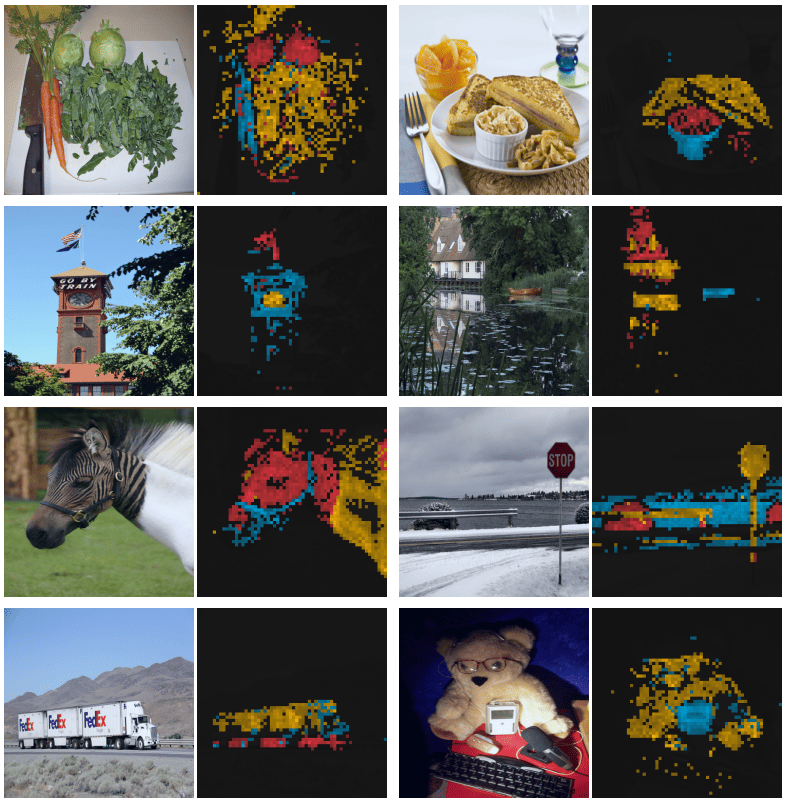

Attention maps from multiple heads | [Источник](https://arxiv.org/abs/2104.14294)

Также мы можем выделить какую-то конкретную точку и отследить значения в self-attention для нее.

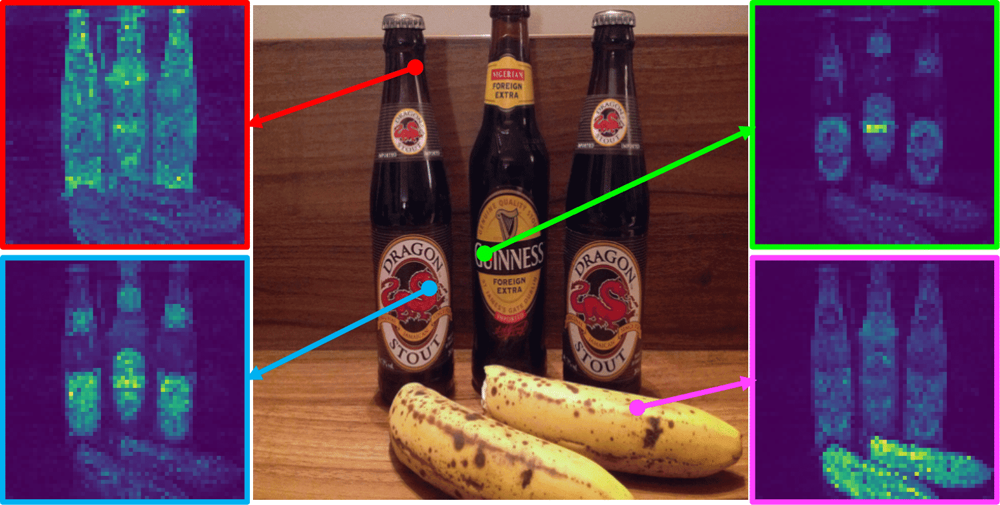

Self-attention for a set of reference points | [Источник](https://arxiv.org/abs/2104.14294)

#### `DINOv2 (2023)`

[Статья](https://arxiv.org/abs/2304.07193) | 4955 цитирований

Спустя 2 года после DINO выходит **DINOv2**. Основные моменты перечислены ниже

- Image-level objective: кросс-энтропия как в DINO.

$$ \mathcal{L}_{\text{DINO}} = - \sum p_t \log p_s; $$

- Patch-level objective: маскирование отдельных патчей для входа студента (не учителя!). Цель: выходы для замаскированных патчей студента, должны быть похожи на выходы для этих же патчей учителя.

$$ \mathcal{L}_{\text{iBOT}} = - \sum p_{ti} \log p_{si}; $$

- Untying head weights between both objectives: для получения вероятностей в каждом лоссе используются MLP. Лучше, если в этих MLP есть общие веса;

- KoLeo regularizer: дополнительная регуляризация, чтобы выходы моделей для разных изображений были не близки;

- Adapting the resolution: в конце обучения использовать изображения в высоком разрешении (512$\times$512), чтобы повысить качество признаков для маленьких деталей, которые в разрешении (224$\times$224) были бы незаметны.

- В качестве аугментаций используются изображения

Достаточно много идей, инженерии и еще больше ablation study. Кроме того, крайне много эффективного кода:

- Fast and memory-efficient attention;

- Sequence packing;

- Fully-Sharded Data Parallel (FSDP).

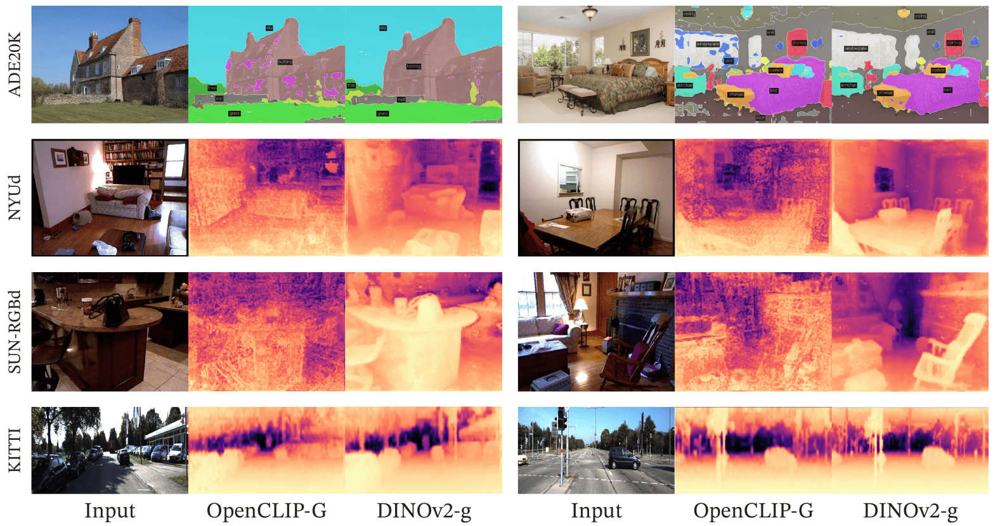

Segmentation and depth estimation with linear classifiers. | [Источник](https://arxiv.org/abs/2304.07193)

Так как мы выучили хорошие признаки, то можно делать много еще всякого разного, например, матчить семантически похожие точки между разными изображениями.

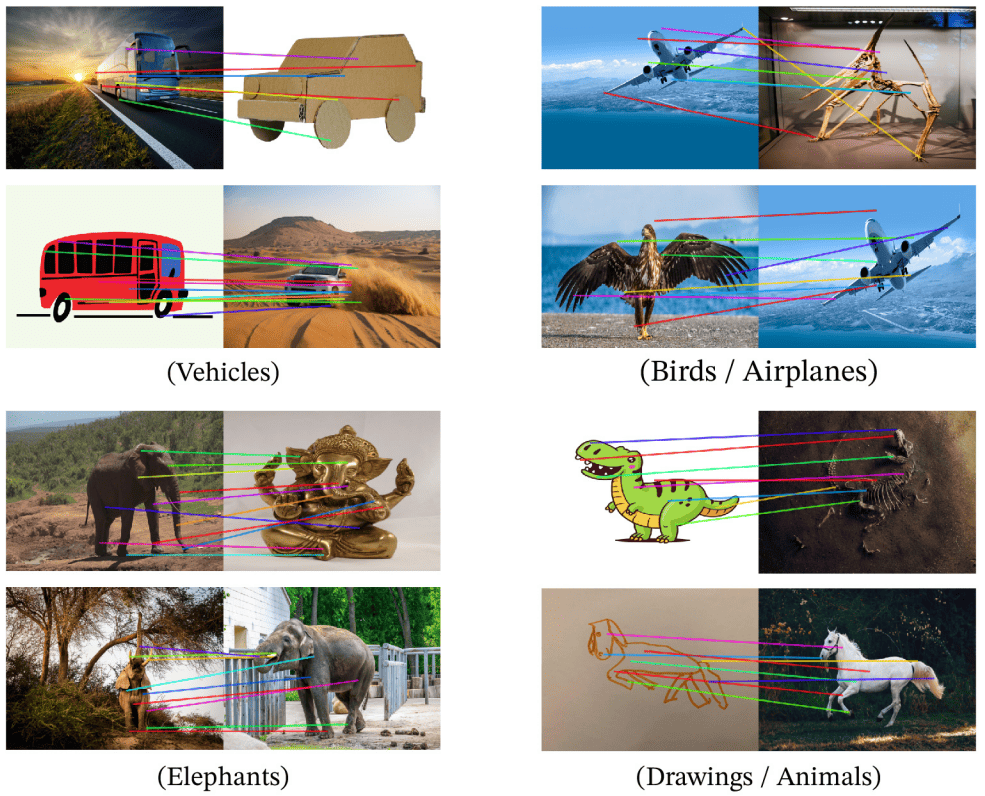

Matching across images. | [Источник](https://arxiv.org/abs/2304.07193)

#### `Mask DINO (2022)`

[Статья](https://arxiv.org/abs/2206.02777) | 630 цитирований

Мы обсуждали семантическую сегментацию, что сильно отличается детекции объектов. К счастью, есть работы, которые на основе DINO моделей строят модели для детекции высокого уровня. Про то, как адаптировать DINO для детекции можно прочитать в статье.

#### `DINO v3 (2025)`

[Статья](https://arxiv.org/abs/2508.10104) | 34 цитирований на момемент 5 октября 2025, дата публикации 13 августа 2025

Основное идейное изменение --- матчить матрицу Грама признаков студента с матрицей Грама признаков учителя:

$$\mathcal{L}_{\text{Gram}} = \| X_S \cdot X_S^\top - X_G \cdot X_G^\top \|_F^2$$.

Если дополнительно применить много инженерных трюков, взять большие архитектуры, подобрать параметры оптимизации и много всего разного, то можно получить:

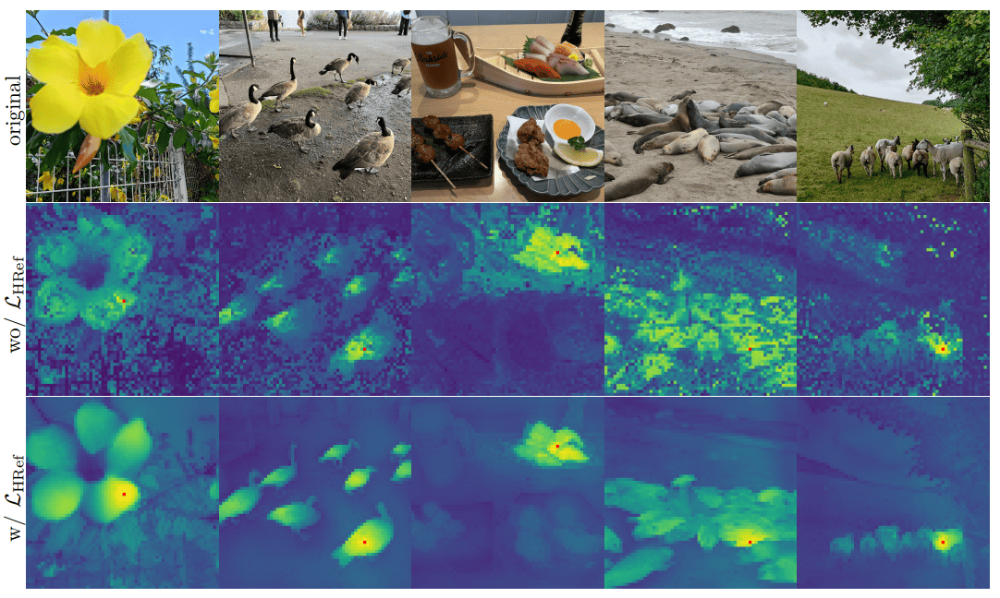

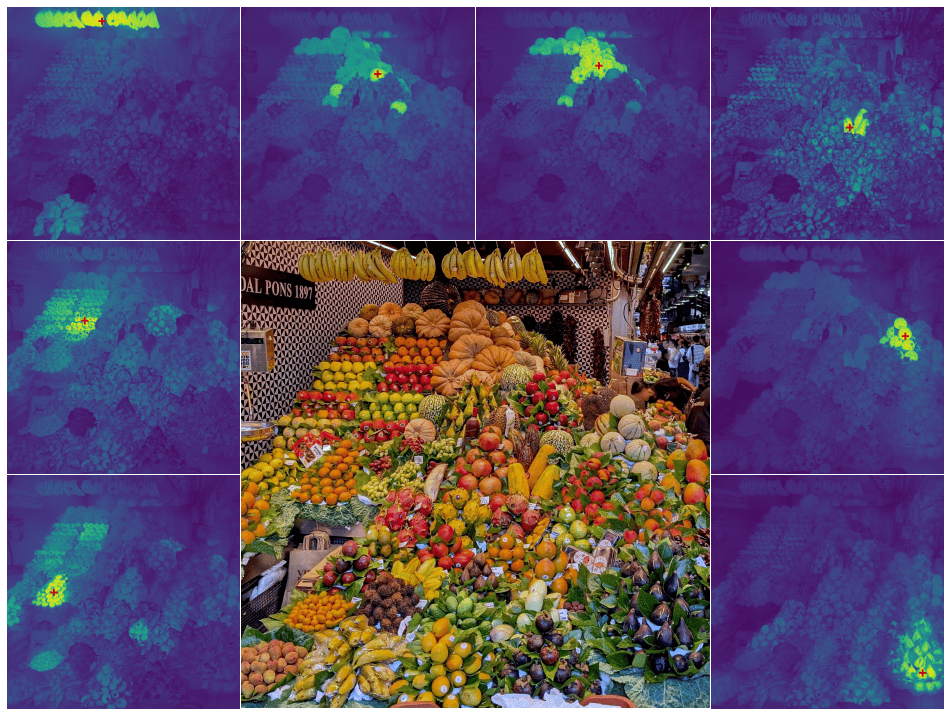

Cosine similarity maps obtained with DINOv3 output features | [Источник](https://arxiv.org/abs/2508.10104)

### `Label-Efficient Semantic Segmentation with Diffusion Models (2021)`

[Статья](https://arxiv.org/abs/2112.03126) | 738 цитирований

Dmitry Baranchuk, Ivan Rubachev, Andrey Voynov, Valentin Khrulkov, Artem Babenko

Диффузионные модели генерируют изображения шаг за шагом, постепенно удаляя шум с изображения. Удаление шума просиходит с помощью обученной нейронной сети.

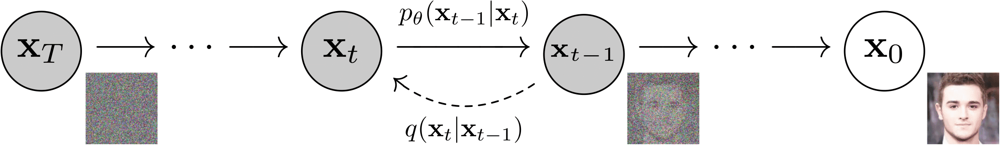

Процесс генерации | [Источник](https://arxiv.org/abs/2006.11239)

**Основная идея**. Если мы обучаем нейронную сеть расшумлять объект, то значит она умеет извлекать "полезные" признаки из изображения. Если мы возьмем изображение, зашумим его до момента времени $t$, то получим $x_t$. Далее мы можем предсказать свойства зашумленного объекта и извлечь признаки с разных слоев U-Net.

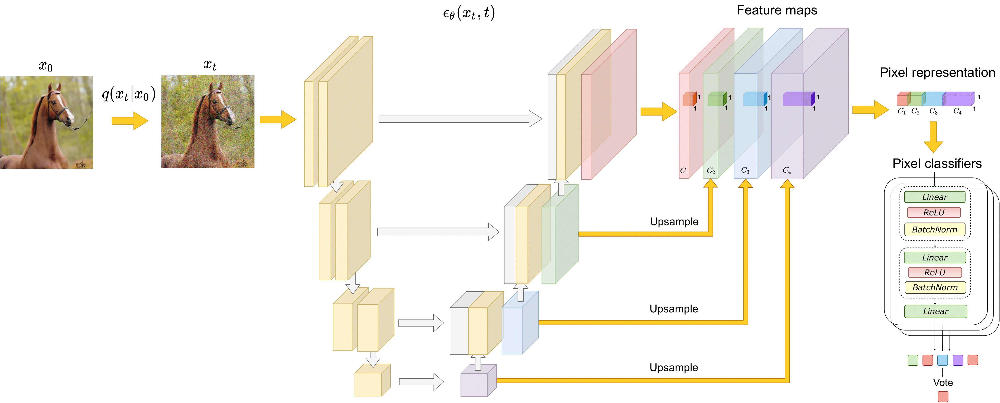

Method | [Источник](https://arxiv.org/abs/2112.03126)

Оказывается, что признаки извлекаемы из определенных слоев U-Net достаточно хорошо сегментируют объект.

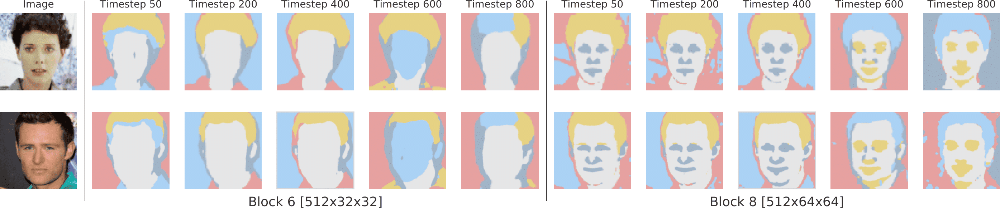

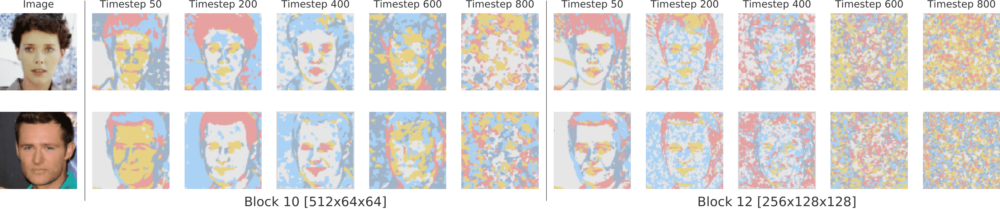

Examples of k-means clusters (k=5) formed by the features extracted from the U-Net | [Источник](https://arxiv.org/abs/2112.03126)